### QUESTION-1

In [1]:
import numpy as np
from PIL import Image
import cv2 as cv
import matplotlib.pyplot as plt

In [5]:
img = Image.open("C:/Users/anjan/Desktop/Art.jpg")
img

UnidentifiedImageError: cannot identify image file 'C:/Users/anjan/Desktop/Art.jpg'

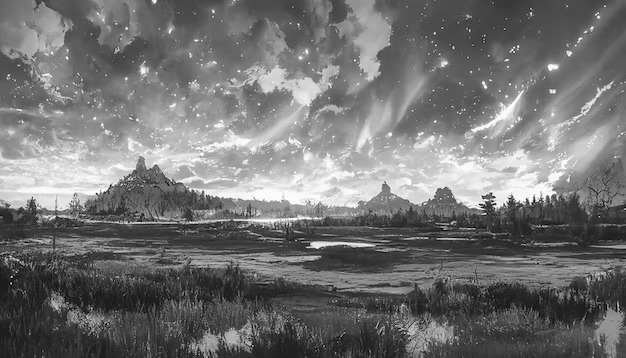

In [3]:
img = img.convert('LA')
img

In [4]:
width = img.width
height = img.height
size = width*height
size

224108

In [5]:
#histogram function 
img = np.array(img)
flat = img.flatten() #image slicing into 1D 

def get_histogram(image, bins):
    count = np.zeros(bins) # array with size of bins, set to zeros
    # loop through pixels and sum up counts of pixels
    for pixel in image:
        count[pixel] += 1
    return count

count = get_histogram(flat, 256)

In [6]:
print(count[0])
prob_count = count/size
print(prob_count[0])

4.0
1.784853731236725e-05


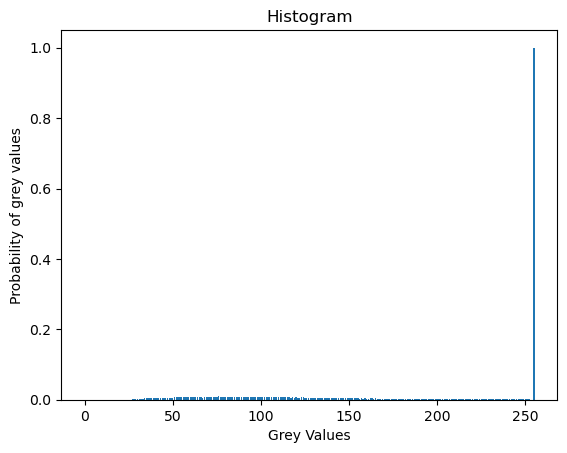

In [7]:
x_axis = np.arange(0,256)
plt.bar(x_axis,prob_count)
plt.title("Histogram")
plt.xlabel("Grey Values")
plt.ylabel("Probability of grey values")
plt.show()

In [8]:
cdf = np.zeros(256)
cdf[0] = prob_count[0]
for i in range(1,len(prob_count)):
    cdf[i] = cdf[i-1]+prob_count[i]
#print(cdf)

In [9]:
transformed_greyval = cdf*7
#print(transformed_greyval)

In [10]:
equalized_histval = np.round_(transformed_greyval) 
#print(equalized_histval)

In [11]:
eq_val = dict()
for i in range(256):
    eq_val[i]=0
for i,j in enumerate(equalized_histval):
    #print(i,j)
    eq_val[j] += prob_count[i]
#print(eq_val.items())

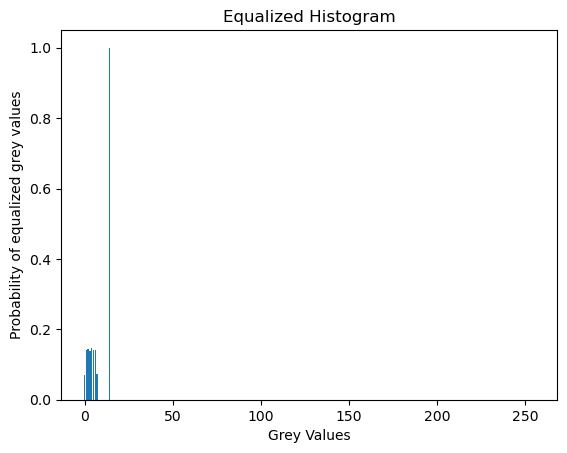

In [12]:
x_axis = eq_val.keys()
y_axis = eq_val.values()
plt.bar(x_axis, y_axis)
plt.title("Equalized Histogram")
plt.xlabel("Grey Values")
plt.ylabel("Probability of equalized grey values")
plt.show()

In [13]:
cdf = np.cumsum(list(eq_val.values()))
cdf_normalized = cdf / cdf.max()
threshold_value = np.argmax(cdf_normalized > 0.5) 
print("Threshold value:", threshold_value)


Threshold value: 14


In [14]:
threshold_value = 8

#### Adaptive Thresholding

In [15]:
img = cv.imread('Art.jpg')
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

In [16]:
#apply normal and adaptive thresholding to the image
ret, thresh = cv.threshold(gray, threshold_value, 255, cv.THRESH_BINARY)
adapt = cv.adaptiveThreshold(gray,255,cv.ADAPTIVE_THRESH_MEAN_C,
                             cv.THRESH_BINARY,99,3)

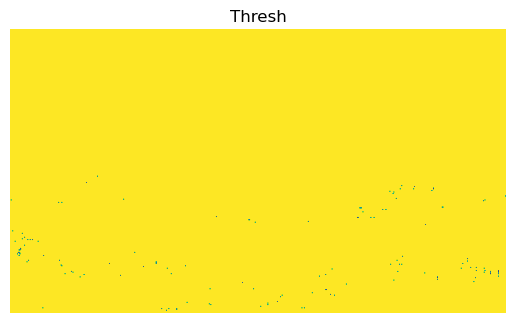

In [17]:
plt.imshow(thresh)
plt.title('Thresh')
plt.axis('off')
plt.show()

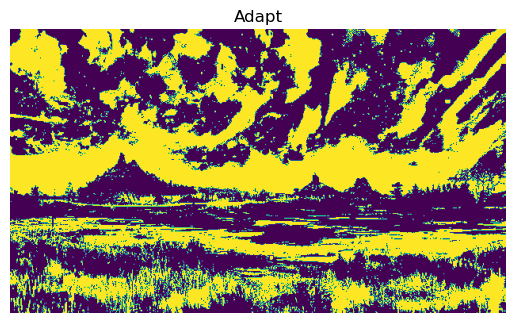

In [18]:
plt.imshow(adapt)
plt.title('Adapt')
plt.axis('off')
plt.show()

#### Watershed Algorithm

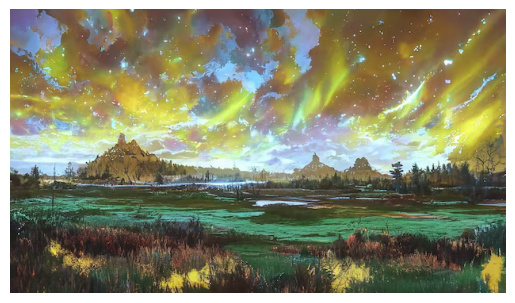

In [19]:
img2 = cv.imread('Art.jpg')
plt.imshow(img2)
plt.axis('off')
plt.show()

In [20]:
gray = cv.cvtColor(img2, cv.COLOR_BGR2GRAY)

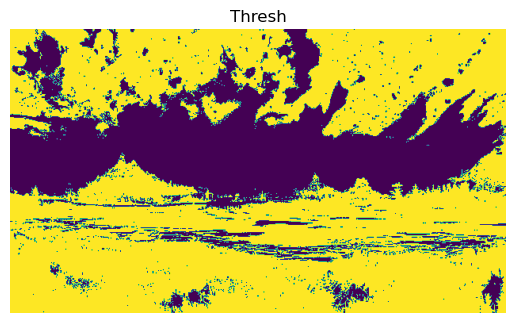

In [21]:
# Threshold using OTSU
ret, thresh = cv.threshold(gray, 0, 255, 
                            cv.THRESH_BINARY_INV + cv.THRESH_OTSU)
plt.imshow(thresh)
plt.title('Thresh')
plt.axis('off')
plt.show()

In [22]:
'''1. Creation of kernel'''
kernel = np.ones( (3,3), np.uint8)
#creates a 3x3 square kernel where all elements are 1.

In [23]:
'''2. Applying the opening operation'''
opening = cv.morphologyEx(thresh,cv.MORPH_OPEN, kernel, iterations=2)
#thresh is the binary image obtained after thresholding
#kernel is our structuring element

In [24]:
'''3. Dilation for Background Identification'''
sure_bg = cv.dilate(opening, kernel)
#dilation operation is used to identify the bg region of the img
#result of previous step is subjected to dilation
#dilation expands the objects and a significant portion around the
#objects is expected to be the background region

'''4. Distance Transformation'''

The cv2.distanceTransform function calculates the distance from each </br>
binary image pixel to the nearest zero pixel using the cv2.DIST_L2 </br>
(Euclidean distance) </br>


The distance transform helps us identify regions that are likely to </br>
be in the foreground. The function cv2.distanceTransform </br>
(opening, cv2.DIST_L2, 5) calculates this transform. </br>

In [25]:
dist_transform = cv.distanceTransform(opening, cv.DIST_L2,5)

After calculating the distance transform, we apply thresholding to </br>
this transformed image to get the sure foreground region. </br>
The cv2.threshold(dist_transform, 0.7*dist_transform.max(), 255, 0) </br>
function call applies the thresholding. The second parameter </br>
0.7*dist_transform.max() sets the threshold level at 70% of the </br>
max dist found by the dist transform. Pixels with dist </br>
transform values higher than this threshold are set as sure fg. </br>

In [26]:
ret, sure_fg = cv.threshold(
    dist_transform, 0.7 * dist_transform.max(), 255, 0)

'''5. Identify unknown regions'''

We identify the unknown region, i.e., the region that is neither </br>
sure foreground nor sure background. We first convert the sure </br>
foreground (sure_fg) into an unsigned 8-bit integer. </br>
We then subtract the sure foreground from the sure background </br>
(sure_bg) to get the unknown region. </br>

The unknown region is key for the Watershed algorithm because it </br>
signifies the transition region between distinct objects or between </br>
an object and the background. </br>

In [27]:
# Finding unknown region
sure_fg = np.uint8(sure_fg)
unknown = cv.subtract(sure_bg, sure_fg)

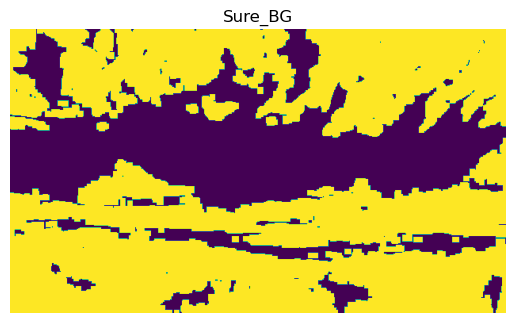

In [28]:
plt.imshow(sure_bg)
plt.title('Sure_BG')
plt.axis('off')
plt.show()

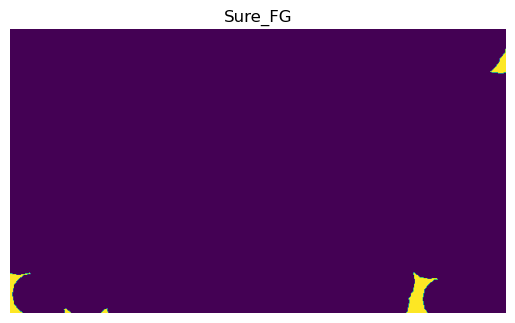

In [29]:
plt.imshow(sure_fg)
plt.title('Sure_FG')
plt.axis('off')
plt.show()

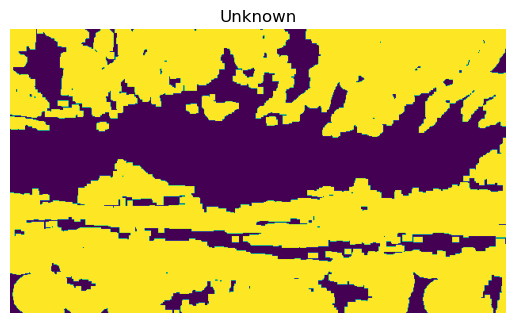

In [30]:
plt.imshow(unknown)
plt.title('Unknown')
plt.axis('off')
plt.show()

In [31]:
'''6. Label sure_bg, sure_fg and unknown regions'''
ret, markers = cv.connectedComponents(sure_fg)

# Add one to all labels so that sure background is not 0, but 1
markers = markers+1

# Now, mark the region of unknown with zero
markers[unknown==255] = 0

'''
This involves creating a marker and labeling the regions inside it
The regions we mark are the sure background (sure_bg), sure 
foreground (sure_fg), and the unknown regions.'''

'\nThis involves creating a marker and labeling the regions inside it\nThe regions we mark are the sure background (sure_bg), sure \nforeground (sure_fg), and the unknown regions.'

In [32]:
'''7. Watershed Algorithm'''
markers = cv.watershed(img2,markers)
img2[markers == -1] = [255,0,0]

#imshow("img", img)

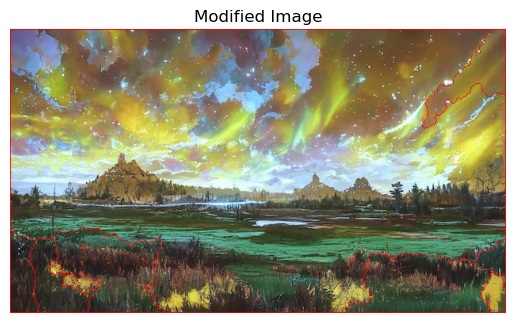

In [33]:
plt.imshow(img2)
plt.title('Modified Image')
plt.axis('off')
plt.show()

circular structural element

In [34]:
img2 = cv.imread('Art.jpg')
gray = cv.cvtColor(img2, cv.COLOR_BGR2GRAY)

In [35]:
# Threshold using OTSU
ret, thresh = cv.threshold(gray, 0, 255, 
                            cv.THRESH_BINARY_INV + cv.THRESH_OTSU)

In [36]:
# Function to create a circular structuring element
def create_circular_kernel(radius):
    diameter = 2 * radius + 1
    kernel = np.zeros((diameter, diameter), dtype=np.uint8)
    center = (radius, radius)
    cv.circle(kernel, center, radius, 1, thickness=-1)
    return kernel

radius = 5  # Adjust the radius as needed
kernel = create_circular_kernel(radius)

In [37]:
opening = cv.morphologyEx(thresh,cv.MORPH_OPEN, kernel, iterations=2)
sure_bg = cv.dilate(opening, kernel)
dist_transform = cv.distanceTransform(opening, cv.DIST_L2,5)
ret, sure_fg = cv.threshold(
    dist_transform, 0.7 * dist_transform.max(), 255, 0)
sure_fg = np.uint8(sure_fg)
unknown = cv.subtract(sure_bg, sure_fg)
ret, markers = cv.connectedComponents(sure_fg)
markers = markers+1
markers[unknown==255] = 0
markers = cv.watershed(img2,markers)
img2[markers == -1] = [255,0,0]

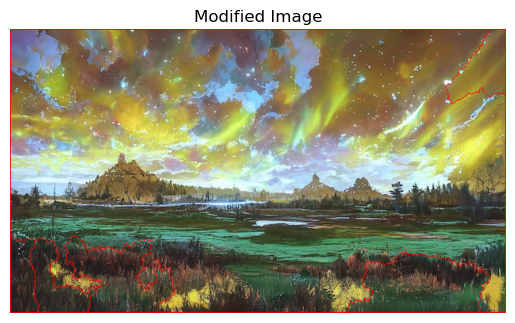

In [38]:
plt.imshow(img2)
plt.title('Modified Image')
plt.axis('off')
plt.show()

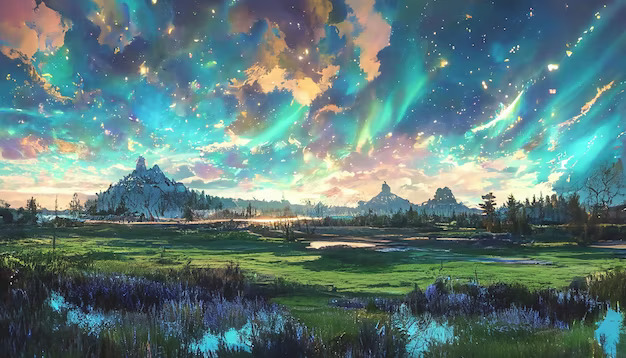

In [39]:
import cv2
img = Image.open("Art.jpg")
img

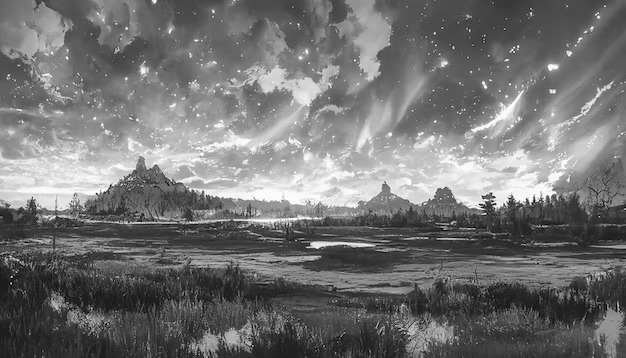

In [40]:
img_gray = img.convert('LA')
img_gray

### QUESTION-2

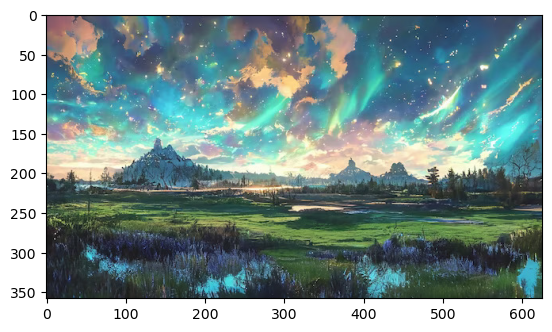

In [42]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
 
%matplotlib inline
 
# Read in the image
image = cv2.imread('Art.jpg')
 
# Change color to RGB (from BGR)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
 
plt.imshow(image)


In [43]:
# Reshaping the image into a 2D array of pixels and 3 color values (RGB)
pixel_vals = image.reshape((-1,3))
 
# Convert to float type
pixel_vals = np.float32(pixel_vals)


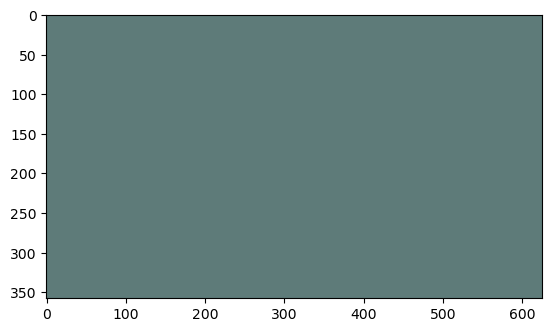

In [44]:
#the below line of code defines the criteria for the algorithm to stop 
#running, which will happen is 100 iterations are run or the epsilon 
#(which is the required accuracy) becomes 85%
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 
            0.85)
 
# then perform k-means clustering with number of clusters defined as 3
#also random centres are initially choosed for k-means clustering
k = 1
retval, labels, centers = cv2.kmeans(pixel_vals, k, None, criteria, 
                                     10, cv2.KMEANS_RANDOM_CENTERS)
 
# convert data into 8-bit values
centers = np.uint8(centers)
segmented_data = centers[labels.flatten()]
 
# reshape data into the original image dimensions
segmented_image = segmented_data.reshape((image.shape))
 
plt.imshow(segmented_image)

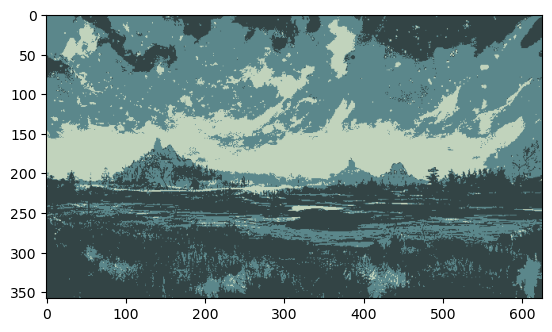

In [45]:
#the below line of code defines the criteria for the algorithm to stop 
#running, which will happen is 100 iterations are run or the epsilon 
#(which is the required accuracy) becomes 85%
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 
            0.85)
 
# then perform k-means clustering with number of clusters defined as 3
#also random centres are initially choosed for k-means clustering
k = 3
retval, labels, centers = cv2.kmeans(pixel_vals, k, None, criteria, 
                                     10, cv2.KMEANS_RANDOM_CENTERS)
 
# convert data into 8-bit values
centers = np.uint8(centers)
segmented_data = centers[labels.flatten()]
 
# reshape data into the original image dimensions
segmented_image = segmented_data.reshape((image.shape))
 
plt.imshow(segmented_image)

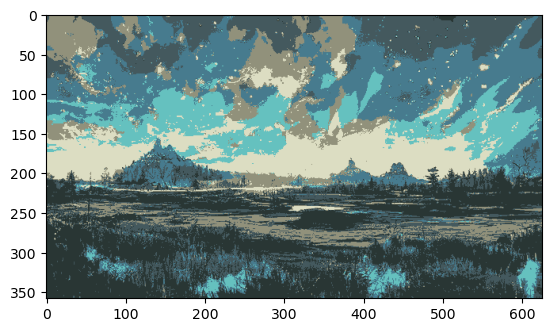

In [46]:
#the below line of code defines the criteria for the algorithm to stop 
#running, which will happen is 100 iterations are run or the epsilon 
#(which is the required accuracy) becomes 85%
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 
            0.85)
 
# then perform k-means clustering with number of clusters defined as 3
#also random centres are initially choosed for k-means clustering
k = 6
retval, labels, centers = cv2.kmeans(pixel_vals, k, None, criteria, 
                                     10, cv2.KMEANS_RANDOM_CENTERS)
 
# convert data into 8-bit values
centers = np.uint8(centers)
segmented_data = centers[labels.flatten()]
 
# reshape data into the original image dimensions
segmented_image = segmented_data.reshape((image.shape))
 
plt.imshow(segmented_image)

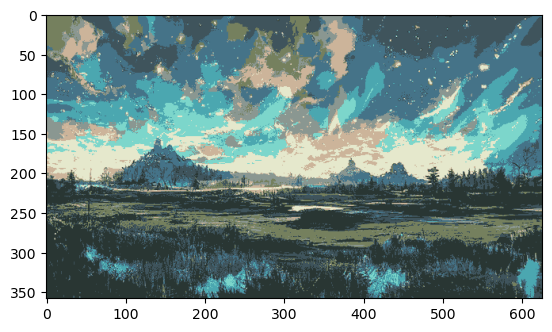

In [47]:
#the below line of code defines the criteria for the algorithm to stop 
#running, which will happen is 100 iterations are run or the epsilon 
#(which is the required accuracy) becomes 85%
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 
            0.85)
 
# then perform k-means clustering with number of clusters defined as 3
#also random centres are initially choosed for k-means clustering
k = 9
retval, labels, centers = cv2.kmeans(pixel_vals, k, None, criteria, 
                                     10, cv2.KMEANS_RANDOM_CENTERS)
 
# convert data into 8-bit values
centers = np.uint8(centers)
segmented_data = centers[labels.flatten()]
 
# reshape data into the original image dimensions
segmented_image = segmented_data.reshape((image.shape))
 
plt.imshow(segmented_image)

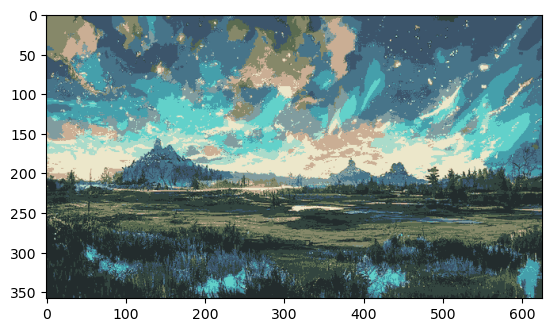

In [48]:
#the below line of code defines the criteria for the algorithm to stop 
#running, which will happen is 100 iterations are run or the epsilon 
#(which is the required accuracy) becomes 85%
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 
            0.85)
 
# then perform k-means clustering with number of clusters defined as 3
#also random centres are initially choosed for k-means clustering
k = 12
retval, labels, centers = cv2.kmeans(pixel_vals, k, None, criteria, 
                                     10, cv2.KMEANS_RANDOM_CENTERS)
 
# convert data into 8-bit values
centers = np.uint8(centers)
segmented_data = centers[labels.flatten()]
 
# reshape data into the original image dimensions
segmented_image = segmented_data.reshape((image.shape))
 
plt.imshow(segmented_image)

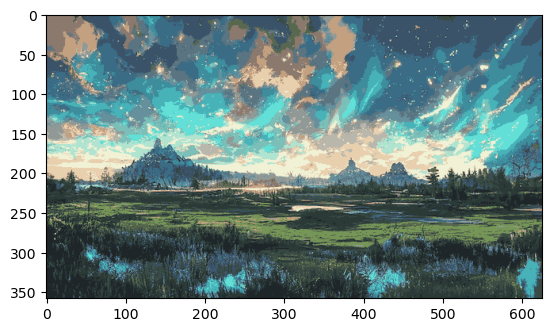

In [49]:
#the below line of code defines the criteria for the algorithm to stop 
#running, which will happen is 100 iterations are run or the epsilon 
#(which is the required accuracy) becomes 85%
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 
            0.85)
 
# then perform k-means clustering with number of clusters defined as 3
#also random centres are initially choosed for k-means clustering
k = 20
retval, labels, centers = cv2.kmeans(pixel_vals, k, None, criteria, 
                                     10, cv2.KMEANS_RANDOM_CENTERS)
 
# convert data into 8-bit values
centers = np.uint8(centers)
segmented_data = centers[labels.flatten()]
 
# reshape data into the original image dimensions
segmented_image = segmented_data.reshape((image.shape))
 
plt.imshow(segmented_image)

### QUESTION-3 : EXTRACT HADNCRAFTED FEATURES FROM IMAGE USING SIFT, HOG ETC

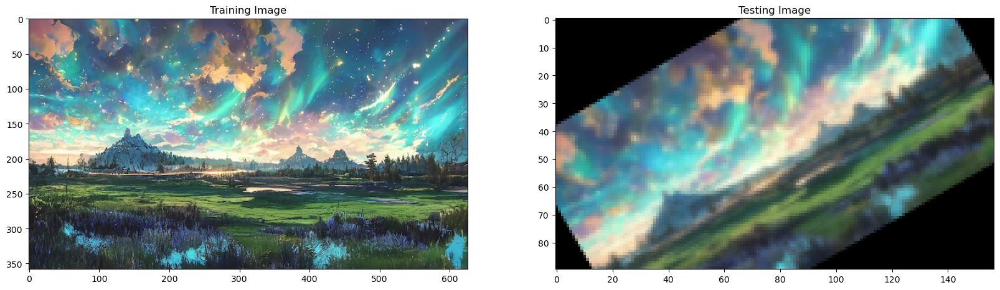

In [53]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

# Load the image
image1 = cv2.imread('Art.jpg')

# Convert the training image to RGB
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

# Convert the training image to gray scale
training_gray = cv2.cvtColor(training_image, cv2.COLOR_RGB2GRAY)

# Create test image by adding Scale Invariance and Rotational Invariance
test_image = cv2.pyrDown(training_image)
test_image = cv2.pyrDown(test_image)
num_rows, num_cols = test_image.shape[:2]

rotation_matrix = cv2.getRotationMatrix2D((num_cols/2, num_rows/2), 30, 1)
test_image = cv2.warpAffine(test_image, rotation_matrix, (num_cols, num_rows))

test_gray = cv2.cvtColor(test_image, cv2.COLOR_RGB2GRAY)

# Display traning image and testing image
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Training Image")
plots[0].imshow(training_image)

plots[1].set_title("Testing Image")
plots[1].imshow(test_image)


Number of Keypoints Detected In The Training Image:  1375
Number of Keypoints Detected In The Query Image:  156


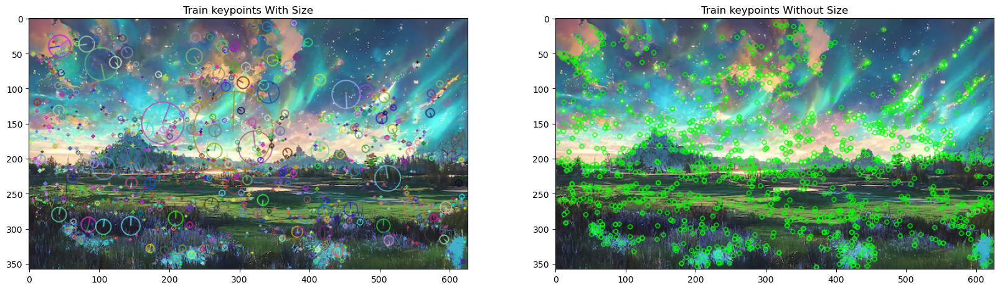

In [55]:
sift = cv2.SIFT_create()

train_keypoints, train_descriptor = sift.detectAndCompute(training_gray, None)
test_keypoints, test_descriptor = sift.detectAndCompute(test_gray, None)

keypoints_without_size = np.copy(training_image)
keypoints_with_size = np.copy(training_image)

cv2.drawKeypoints(training_image, train_keypoints, keypoints_without_size, color = (0, 255, 0))

cv2.drawKeypoints(training_image, train_keypoints, keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display image with and without keypoints size
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Train keypoints With Size")
plots[0].imshow(keypoints_with_size, cmap='gray')

plots[1].set_title("Train keypoints Without Size")
plots[1].imshow(keypoints_without_size, cmap='gray')

# Print the number of keypoints detected in the training image
print("Number of Keypoints Detected In The Training Image: ", len(train_keypoints))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(test_keypoints))

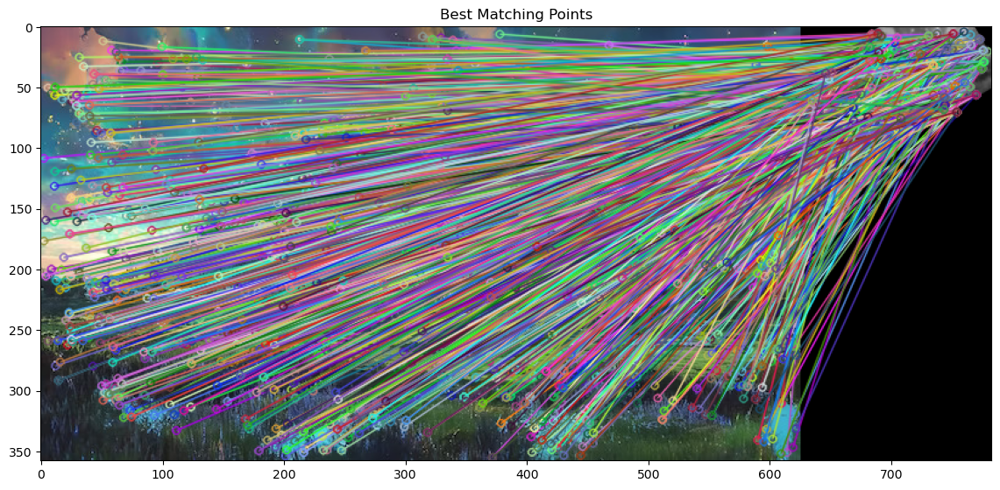


Number of Matching Keypoints Between The Training and Query Images:  1375


In [56]:
# Create a Brute Force Matcher object.
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck = False)

# Perform the matching between the SIFT descriptors of the training image and the test image
matches = bf.match(train_descriptor, test_descriptor)

# The matches with shorter distance are the ones we want.
matches = sorted(matches, key = lambda x : x.distance)

result = cv2.drawMatches(training_image, train_keypoints, test_gray, test_keypoints, matches, test_gray, flags = 2)

# Display the best matching points
plt.rcParams['figure.figsize'] = [14.0, 7.0]
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print total number of matching points between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

### HOG Feature Extraction

(358, 626, 3)


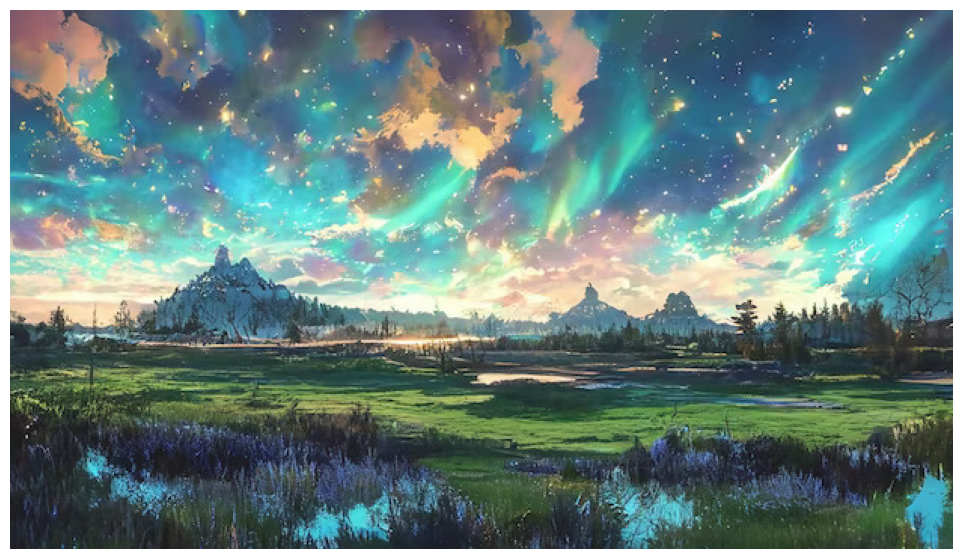

In [57]:
from skimage.io import imread
from skimage.transform import resize
from skimage.feature import hog
from skimage import exposure
import matplotlib.pyplot as plt

# reading the image
img = imread('Art.jpg')
plt.axis("off")
plt.imshow(img)
print(img.shape)

(512, 256, 3)


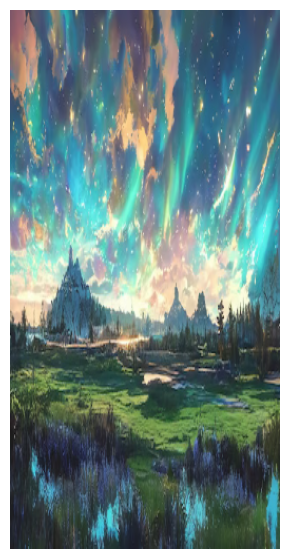

In [58]:
resized_img = resize(img, (128*4, 64*4))
plt.axis("off")
plt.imshow(resized_img)
print(resized_img.shape)

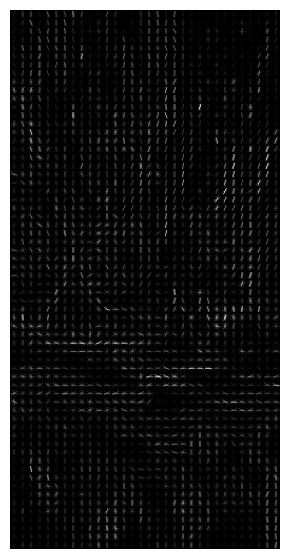

In [66]:
#creating hog features
fd, hog_image = hog(resized_img, orientations=9, pixels_per_cell=(8, 8),
                	cells_per_block=(2, 2), visualize=True, channel_axis=2)
plt.axis("off")
plt.imshow(hog_image, cmap="gray")